In [1]:
import pandas as pd
%pip install networkx
import networkx as nx
import matplotlib.pyplot as plt

df70 = pd.read_csv('../data/IEA_EDGAR_CO2_1970-2021_byyear.csv')

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [61]:
%pip install nams

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [2]:
df70

,IPCC_annex,C_group_IM24_sh,Country_code_A3,Name,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_name,Substance,fossil_bio,Y_1970,Y_1971,...,Y_2012,Y_2013,Y_2014,Y_2015,Y_2016,Y_2017,Y_2018,Y_2019,Y_2020,Y_2021
0,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.1.a,Main Activity Electricity and Heat Production,CO2,bio,0.022397,0.021412,...,1.337603,2.371433,2.497066,2.970795,2.438748,2.509098,3.096665,3.255611,3.378899,3.378899
1,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.2,Manufacturing Industries and Construction,CO2,bio,12.228673,11.690942,...,9.856529,6.886571,6.890052,7.378661,7.853166,9.340506,7.365402,7.718069,8.047569,8.047569
2,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.4,Residential and other sectors,CO2,bio,0.879948,0.845336,...,6.473158,6.021210,6.630579,5.848465,6.489807,6.417006,6.410401,4.571319,7.808080,7.808080
3,Non-Annex_I,Rest Central America,ABW,Aruba,1.A.5,Non-Specified,CO2,bio,0.058367,0.056820,...,1.714841,1.721481,1.838701,2.157164,1.972983,2.068339,2.147736,2.004358,2.450398,2.450398
4,Non-Annex_I,Rest Central America,ABW,Aruba,1.B.1,Solid Fuels,CO2,bio,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4768,Non-Annex_I,Southern_Africa,ZWE,Zimbabwe,2.A.4,Other Process Uses of Carbonates,CO2,fossil,NaN,NaN,...,1.753279,2.182478,1.474799,1.951282,1.528562,1.739092,1.509467,1.374865,1.389039,1.417387
4769,Non-Annex_I,Southern_Africa,ZWE,Zimbabwe,2.B,Chemical Industry,CO2,fossil,92.565000,155.040000,...,63.750000,68.850000,56.100000,58.800000,10.500000,31.500000,33.600000,10.500000,10.500000,NaN
4770,Non-Annex_I,Southern_Africa,ZWE,Zimbabwe,2.C,Metal Industry,CO2,fossil,1357.949642,1202.712467,...,178.100000,195.078000,278.343000,150.261800,185.640000,185.640000,234.000000,228.743089,222.373569,310.070187
4771,Non-Annex_I,Southern_Africa,ZWE,Zimbabwe,2.D,Non-Energy Products from Fuels and Solvent Use,CO2,fossil,22.738632,23.553464,...,57.840742,57.879892,58.915828,57.958218,58.034373,58.111482,58.189518,59.330242,54.166537,57.980658


# 1970 Network

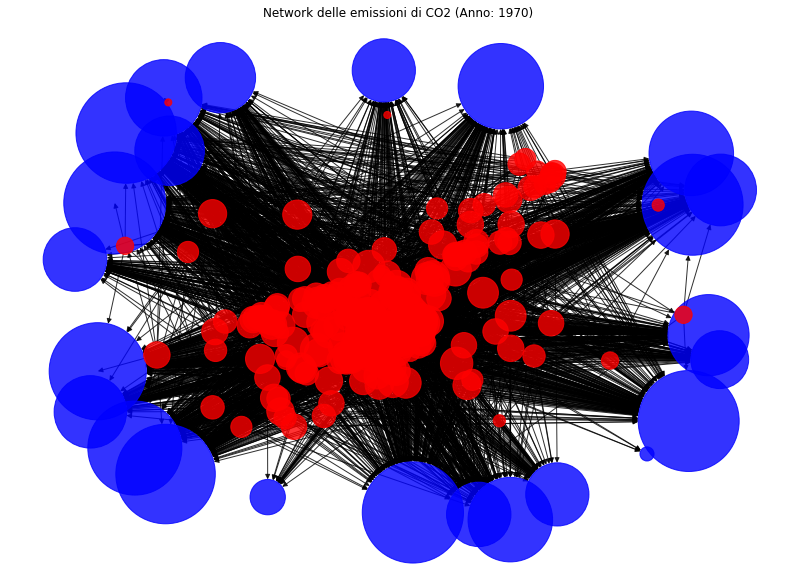

In [32]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms import bipartite


# Selezioniamo solo le colonne di interesse
df70_network = df70[["Country_code_A3", "ipcc_code_2006_for_standard_report", "Y_1970"]]

# Rimuoviamo le righe con valori mancanti nella colonna "Y_1970"
df70_network = df70_network.dropna(subset=["Y_1970"])

# Creiamo un grafo indiretto (non diretto)
G = nx.DiGraph()

# Aggiungiamo i nodi al grafo
for _, row in df70_network.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    G.add_node(country_code, label=country_code, color="red", bipartite=0)  # Nodi dal "C_group_IM24_sh" saranno rossi
    G.add_node(ipcc_code, label=ipcc_code, color="blue", bipartite=1)        # Nodi non dal "C_group_IM24_sh" saranno blu

# Aggiungiamo gli archi al grafo con i pesi basati su "Y_1970"
for _, row in df70_network.iterrows():
    country_code = row["Country_code_A3"]
    ipcc_code = row["ipcc_code_2006_for_standard_report"]
    weight = row["Y_1970"]
    '''
    # Se esiste già un arco tra i due nodi, aggiorna il peso
    if G.has_edge(country_code, ipcc_code):
        G[country_code][ipcc_code]['weight'] += weight
    else: '''

    G.add_edge(country_code, ipcc_code, weight=weight)

# Posizionamento dei nodi nel plot del grafo
pos = nx.spring_layout(G, seed=42)

# Dimensione dei nodi proporzionale al grado
node_size = [v * 50 for v in dict(G.degree()).values()]

# Colori dei nodi
node_colors = [data["color"] for _, data in G.nodes(data=True)]

# Etichette dei nodi
node_labels = nx.get_node_attributes(G, "label")

# Peso degli archi
edge_weights = nx.get_edge_attributes(G, "weight")

# Creazione del plot del grafo
plt.figure(figsize=(14, 10))
nx.draw_networkx(G, pos, node_size=node_size, node_color=node_colors, with_labels=False, alpha=0.8)
#nx.draw_networkx_labels(G, pos, labels=node_labels, font_size=10, font_weight="bold")
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_weights, font_size=8, font_color="red")

# Titolo del plot
plt.title("Network delle emissioni di CO2 (Anno: 1970)")

# Mostrare il plot del grafo
plt.axis("off")
plt.show()


## Basic info and statistics

In [8]:
#undirected graph
type(G)

networkx.classes.digraph.DiGraph

In [9]:
bipartite.is_bipartite(G)

True

In [10]:
print(G)

DiGraph with 234 nodes and 3092 edges


### Nodes

In [11]:
list(G.nodes())[0:5]

['ABW', '1.A.1.a', '1.A.2', '1.A.4', '1.A.5']

In [11]:
len(G.nodes())

234

In [12]:
#metadata - bipartite info
list(G.nodes(data=True))[0:5]

[('ABW', {'label': 'ABW', 'color': 'red', 'bipartite': 0}),
 ('1.A.1.a', {'label': '1.A.1.a', 'color': 'blue', 'bipartite': 1}),
 ('1.A.2', {'label': '1.A.2', 'color': 'blue', 'bipartite': 1}),
 ('1.A.4', {'label': '1.A.4', 'color': 'blue', 'bipartite': 1}),
 ('1.A.5', {'label': '1.A.5', 'color': 'blue', 'bipartite': 1})]

In [13]:
G.nodes['ABW']

{'label': 'ABW', 'color': 'red', 'bipartite': 0}

### Edges

In [14]:
list(G.edges())[0:5]

[('ABW', '1.A.1.a'),
 ('ABW', '1.A.2'),
 ('ABW', '1.A.4'),
 ('ABW', '1.A.5'),
 ('ABW', '1.A.3.a')]

In [15]:
len(G.edges())

3092

In [16]:
list(G.edges(data=True))[0:5]

[('ABW', '1.A.1.a', {'weight': 34.746760338}),
 ('ABW', '1.A.2', {'weight': 12.705047235}),
 ('ABW', '1.A.4', {'weight': 2.045301737}),
 ('ABW', '1.A.5', {'weight': 39.962045199}),
 ('ABW', '1.A.3.a', {'weight': 1.565827213})]

In [17]:
G.edges['ABW', '1.A.1.a']

{'weight': 34.746760338}

### info

In [ ]:
#%pip install nxviz

### Neighbors

In [27]:
list(G.neighbors('ABW'))


['1.A.1.a',
 '1.A.2',
 '1.A.4',
 '1.A.5',
 '1.A.3.a',
 '1.A.3.b_noRES',
 '1.B.2',
 '2.A.3',
 '2.D']

#### Degree Centrality

By taking the ratio of the number of neighbors a node has to the number of neighbors it could possibly have, we get the degree centrality metric.

Formally defined, the degree centrality of a node (let's call it d) is the number of neighbors that a node has (let's call it n) divided by the number of neighbors it could possibly have (let's call it N):
d=n/N

NetworkX provides a function for us to calculate degree centrality conveniently:

In [28]:
import networkx as nx
import pandas as pd
dcs = pd.Series(nx.degree_centrality(G))
dcs

ABW        0.038627
1.A.1.a    0.875536
1.A.2      0.849785
1.A.4      0.866953
1.A.5      0.626609
             ...   
WSM        0.047210
YEM        0.051502
ZAF        0.081545
ZMB        0.064378
ZWE        0.051502
Length: 234, dtype: float64

In [24]:
#sorted
dcs.sort_values(ascending=False)


2.A.3            0.892704
2.D              0.879828
1.A.1.a          0.875536
1.A.3.b_noRES    0.875536
1.A.4            0.866953
                   ...   
5.B              0.017167
GRL              0.012876
FRO              0.012876
SEA              0.004292
AIR              0.004292
Length: 234, dtype: float64

#### ...

In [25]:
path = nx.shortest_path(G, 'ABW', '1.A.4')
path


['ABW', '1.A.4']

### Visualize bipartite Graph

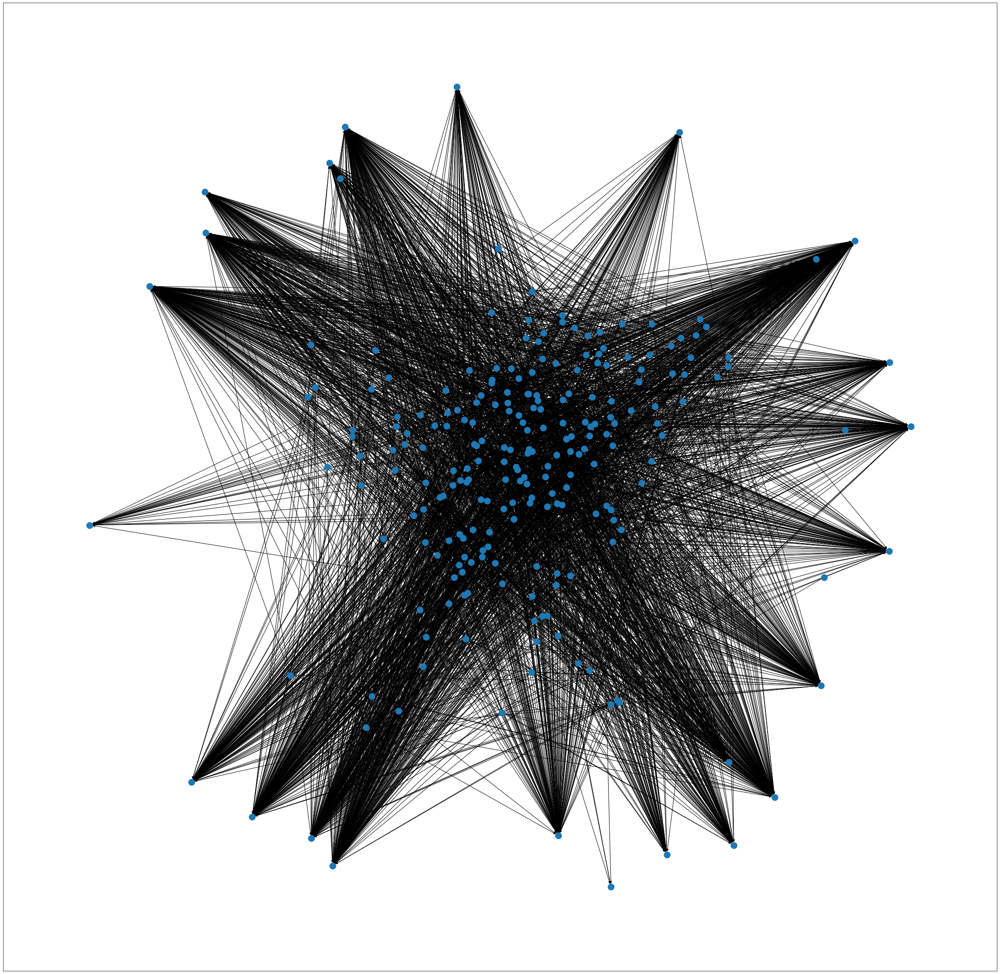

In [22]:
pos = nx.spring_layout(G)
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

In [23]:
bottom_nodes, top_nodes = bipartite.sets(G)

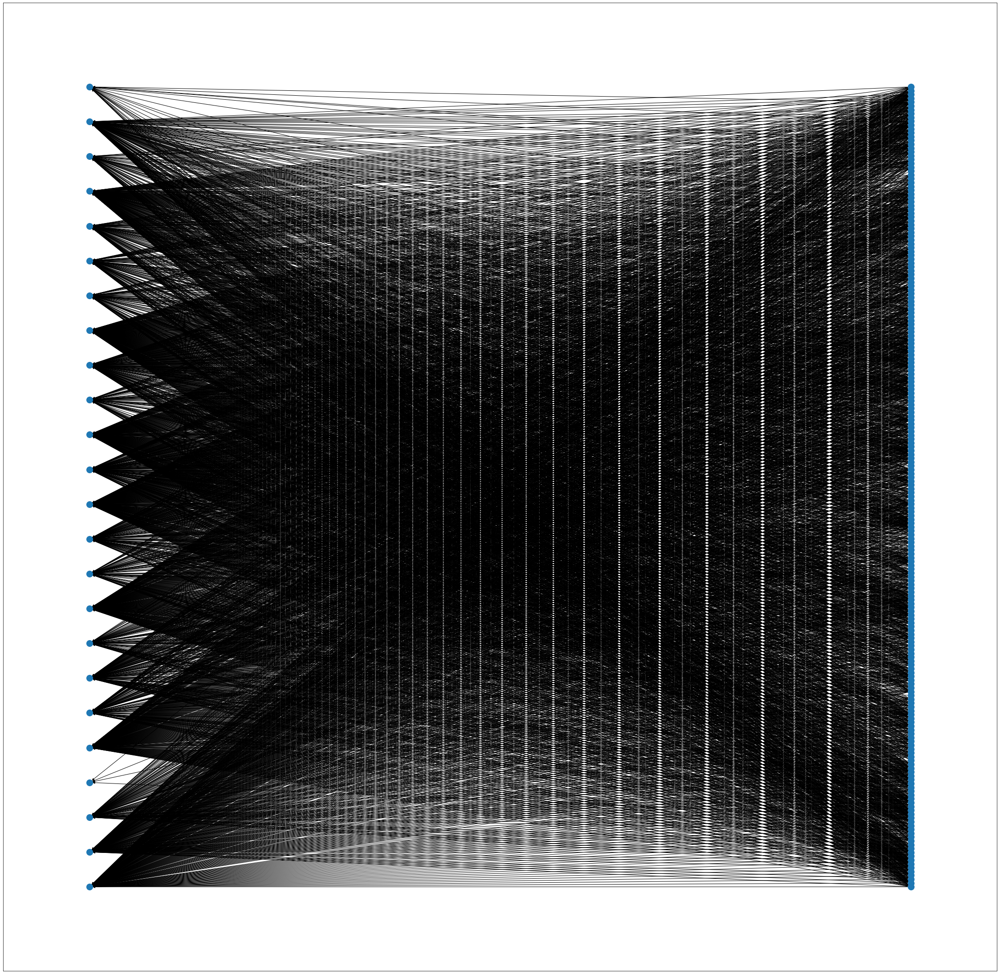

In [26]:
pos = nx.bipartite_layout(G, top_nodes)
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

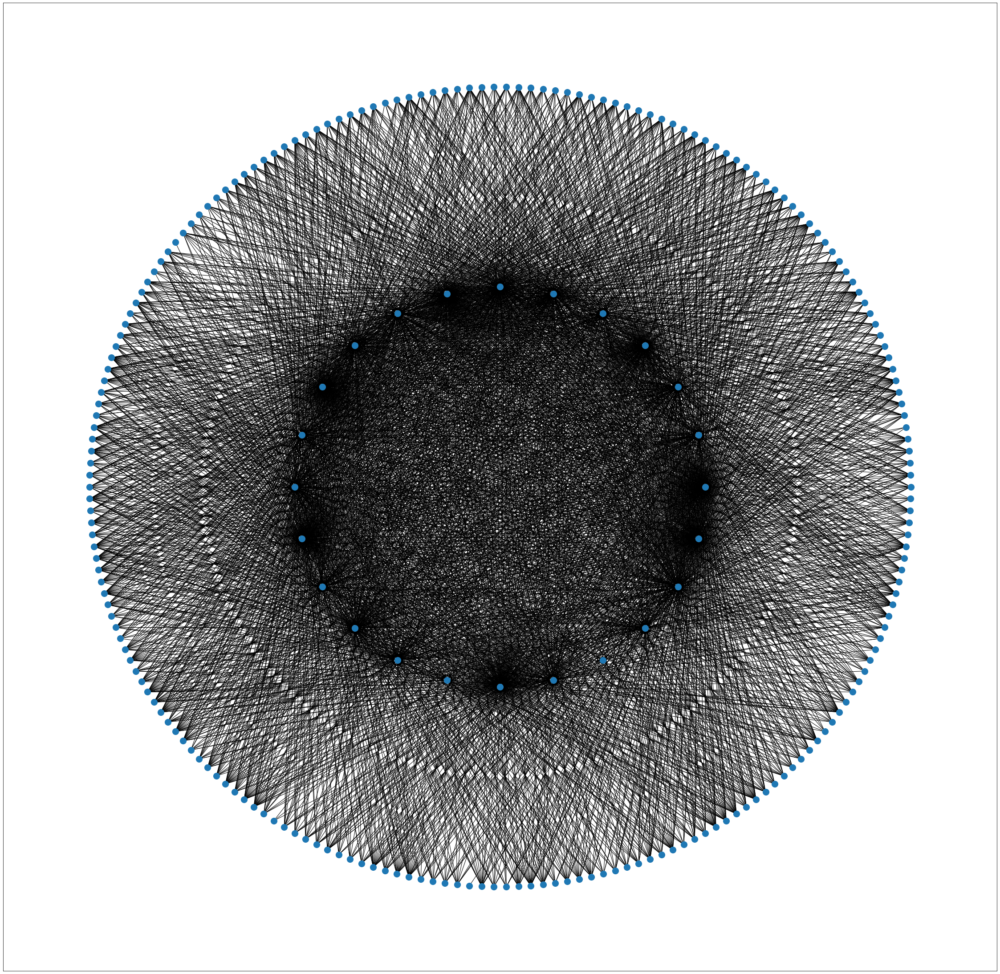

In [30]:
pos = nx.shell_layout(G, [top_nodes,bottom_nodes])
plt.figure(figsize=(40,40))
node_size=200
nx.draw_networkx(G, pos=pos, with_labels=False, node_size=node_size)

In [14]:
print(round(bipartite.density(G, bottom_nodes), 2))



0.31


## Load Centrality

['ABW', '1.A.1.a', '1.A.2', '1.A.4', '1.A.5']

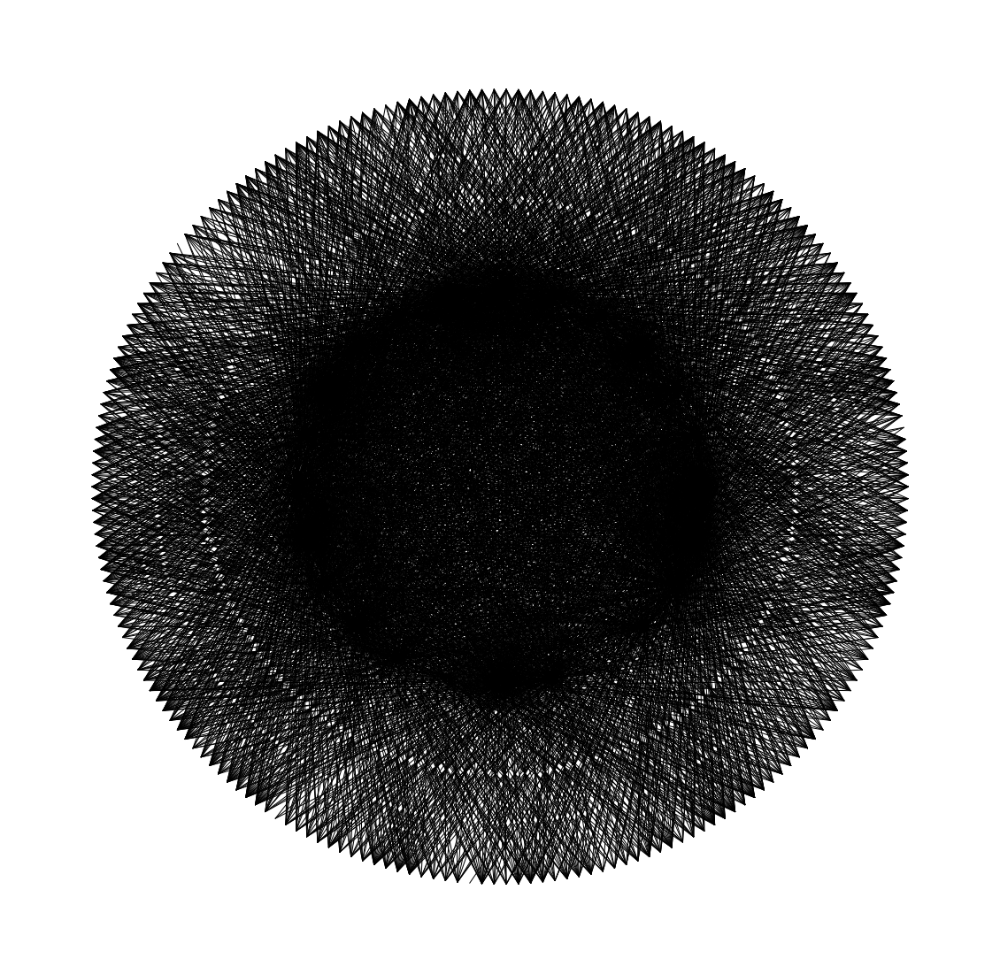

In [31]:
from networkx import load_centrality
LoadCentr=load_centrality(G, v=None, cutoff=None, normalized=True, weight=None)
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LoadCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LoadCentr, key=LoadCentr.get, reverse=True)[:5]

## Laplacian centrality

In [17]:
"""
Laplacian centrality measures.
"""
import networkx as nx

__all__ = ["laplacian_centrality"]


def laplacian_centrality(
    G, normalized=True, nodelist=None, weight="weight", walk_type=None, alpha=0.95
):
    r"""Compute the Laplacian centrality for nodes in the graph `G`.

    The Laplacian Centrality of a node ``i`` is measured by the drop in the
    Laplacian Energy after deleting node ``i`` from the graph. The Laplacian Energy
    is the sum of the squared eigenvalues of a graph's Laplacian matrix.

    .. math::

        C_L(u_i,G) = \frac{(\Delta E)_i}{E_L (G)} = \frac{E_L (G)-E_L (G_i)}{E_L (G)}

        E_L (G) = \sum_{i=0}^n \lambda_i^2

    Where $E_L (G)$ is the Laplacian energy of graph `G`,
    E_L (G_i) is the Laplacian energy of graph `G` after deleting node ``i``
    and $\lambda_i$ are the eigenvalues of `G`'s Laplacian matrix.
    This formula shows the normalized value. Without normalization,
    the numerator on the right side is returned.

    Parameters
    ----------
    G : graph
        A networkx graph

    normalized : bool (default = True)
        If True the centrality score is scaled so the sum over all nodes is 1.
        If False the centrality score for each node is the drop in Laplacian
        energy when that node is removed.

    nodelist : list, optional (default = None)
        The rows and columns are ordered according to the nodes in nodelist.
        If nodelist is None, then the ordering is produced by G.nodes().

    weight: string or None, optional (default=`weight`)
        Optional parameter `weight` to compute the Laplacian matrix.
        The edge data key used to compute each value in the matrix.
        If None, then each edge has weight 1.

    walk_type : string or None, optional (default=None)
        Optional parameter `walk_type` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        If None, the transition matrix is selected depending on the properties
        of the graph. Otherwise can be `random`, `lazy`, or `pagerank`.

    alpha : real (default = 0.95)
        Optional parameter `alpha` used when calling
        :func:`directed_laplacian_matrix <networkx.directed_laplacian_matrix>`.
        (1 - alpha) is the teleportation probability used with pagerank.

    Returns
    -------
    nodes : dictionary
       Dictionary of nodes with Laplacian centrality as the value.

    Examples
    --------
    >>> G = nx.Graph()
    >>> edges = [(0, 1, 4), (0, 2, 2), (2, 1, 1), (1, 3, 2), (1, 4, 2), (4, 5, 1)]
    >>> G.add_weighted_edges_from(edges)
    >>> sorted((v, f"{c:0.2f}") for v, c in laplacian_centrality(G).items())
    [(0, '0.70'), (1, '0.90'), (2, '0.28'), (3, '0.22'), (4, '0.26'), (5, '0.04')]

    Notes
    -----
    The algorithm is implemented based on [1]_ with an extension to directed graphs
    using the ``directed_laplacian_matrix`` function.

    Raises
    ------
    NetworkXPointlessConcept
        If the graph `G` is the null graph.

    References
    ----------
    .. [1] Qi, X., Fuller, E., Wu, Q., Wu, Y., and Zhang, C.-Q. (2012).
       Laplacian centrality: A new centrality measure for weighted networks.
       Information Sciences, 194:240-253.
       https://math.wvu.edu/~cqzhang/Publication-files/my-paper/INS-2012-Laplacian-W.pdf

    See Also
    --------
    directed_laplacian_matrix
    laplacian_matrix
    """
    import numpy as np
    import scipy as sp
    import scipy.linalg  # call as sp.linalg

    if len(G) == 0:
        raise nx.NetworkXPointlessConcept("null graph has no centrality defined")

    if nodelist != None:
        nodeset = set(G.nbunch_iter(nodelist))
        if len(nodeset) != len(nodelist):
            raise nx.NetworkXError("nodelist has duplicate nodes or nodes not in G")
        nodes = nodelist + [n for n in G if n not in nodeset]
    else:
        nodelist = nodes = list(G)

    if G.is_directed():
        lap_matrix = nx.directed_laplacian_matrix(G, nodes, weight, walk_type, alpha)
    else:
        lap_matrix = nx.laplacian_matrix(G, nodes, weight).toarray()

    full_energy = np.power(sp.linalg.eigh(lap_matrix, eigvals_only=True), 2).sum()

    # calculate laplacian centrality
    laplace_centralities_dict = {}
    for i, node in enumerate(nodelist):
        # remove row and col i from lap_matrix
        all_but_i = list(np.arange(lap_matrix.shape[0]))
        all_but_i.remove(i)
        A_2 = lap_matrix[all_but_i, :][:, all_but_i]

        # Adjust diagonal for removed row
        new_diag = lap_matrix.diagonal() - abs(lap_matrix[:, i])
        np.fill_diagonal(A_2, new_diag[all_but_i])

        new_energy = np.power(sp.linalg.eigh(A_2, eigvals_only=True), 2).sum()
        lapl_cent = full_energy - new_energy
        if normalized:
            lapl_cent = lapl_cent / full_energy

        laplace_centralities_dict[node] = lapl_cent

    return laplace_centralities_dict

In [33]:
laplacian_centrality(G, weight="weight")

AttributeError: module 'scipy.sparse' has no attribute 'linalg'

In [18]:
#from networkx import laplacian_centrality
LaplCentr=laplacian_centrality(G, weight='weight')
node_color = [20000.0 * G.degree(v) for v in G]
node_size = [v * 10000 for v in LaplCentr.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
node_color=node_color,
node_size=node_size)
plt.axis('off')
sorted(LaplCentr, key=LaplCentr.get, reverse=True)[:5]

AttributeError: module 'scipy.sparse' has no attribute 'linalg'

In [32]:
top_list=list(top_nodes)

In [33]:
LaplCentr_top=laplacian_centrality(G, nodelist=top_list, weight='weight')

In [34]:
LaplCentr_top

{'1.A.3.c': 0.007749917592083601,
 '3.C.1': 0.006440846444030046,
 '1.A.3.d': 0.007338357113493668,
 '1.B.2': 0.003226528810304624,
 '1.A.1.bc': 0.03444175483644793,
 '2.A.4': 0.0022322070348511783,
 '1.A.3.a': 0.013727281924241285,
 '1.A.3.b_noRES': 0.10980107994358149,
 '3.C.2': 0.0010234918500970256,
 '1.B.1': 0.008417499143890571,
 '2.B': 0.0044485901627649505,
 '2.A.3': 0.00017386875557865865,
 '1.A.5': 0.010823889553210586,
 '2.A.2': 0.0030447753190884306,
 '1.A.1.a': 0.28638675501555455,
 '1.A.3.e': 0.004277785039369972,
 '2.D': 0.011676493616736743,
 '1.A.2': 0.38538601687568563,
 '2.C': 0.005052895033836589,
 '2.A.1': 0.006500360806225924,
 '3.C.3': 0.00013428089742254792,
 '5.B': 0.0014087455314483208,
 '4.C': 0.00019879981540357216,
 '1.A.4': 0.3271435525552403}

In [35]:
bottom_list=list(bottom_nodes)
LaplCentr_countries=laplacian_centrality(G, nodelist=bottom_list, weight='weight')

In [36]:
LaplCentr_countries

{'ANT': 0.0006080497924753834,
 'ABW': 4.032294581764727e-06,
 'ITA': 0.019708254891365445,
 'VEN': 0.0026133438178321563,
 'MAC': 8.500333664675033e-06,
 'ZWE': 0.0019409935601116526,
 'TON': 5.345521394318722e-07,
 'GUF': 2.4707575516159952e-05,
 'IND': 0.05655857527687034,
 'HND': 0.0005797783010470729,
 'BEL': 0.009429667772681888,
 'URY': 0.0004737661481170962,
 'DNK': 0.004395754847608441,
 'BGR': 0.003180641931328966,
 'PRI': 5.264274543084118e-05,
 'LCA': 9.504941455350027e-06,
 'GIB': 3.3704025750978955e-06,
 'BRB': 9.550220858092842e-05,
 'GHA': 0.0007000357412228032,
 'DEU': 0.08127549984192149,
 'KGZ': 0.0008665244450380237,
 'KWT': 0.000744093084670312,
 'COG': 0.0001194446526053094,
 'FLK': 9.39585296339745e-07,
 'MNG': 0.00043503055268787034,
 'GAB': 0.0002249337433844844,
 'BHS': 0.000140308726570102,
 'AIA': 8.720646242424584e-08,
 'MLI': 0.00024728006207091265,
 'COM': 6.814969983978497e-06,
 'FRA': 0.03529913067335289,
 'CPV': 1.4878867983678944e-05,
 'DMA': 9.767334

In [37]:
sorted(LaplCentr_countries, key=LaplCentr_countries.get, reverse=True)[:5]

['USA', 'CHN', 'RUS', 'DEU', 'JPN']

## Simrank
SimRank is an attractive measure of pairwise similarity based on graph topologies. Its underpinning philosophy that “two nodes are similar if they are pointed to (have incoming edges) from similar nodes” can be regarded as an aggregation of similarities based on incoming paths.

In [38]:
all=pd.DataFrame()


In [ ]:
'''
dic_of_dic=nx.simrank_similarity(G)
for key in dic_of_dic.keys():
    s=pd.Series(dic_of_dic[key])
    a_df = pd.DataFrame(({ key: s}))
    print (a_df)
'''

In [39]:
sr70= nx.simrank_similarity(G)
sr70Data = pd.DataFrame(data=sr70)
sr70Data.head()

,ABW,1.A.1.a,1.A.2,1.A.4,1.A.5,1.A.3.a,1.A.3.b_noRES,1.B.2,2.A.3,2.D,...,VCT,VEN,VGB,VNM,VUT,WSM,YEM,ZAF,ZMB,ZWE
ABW,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.545349,0.492141,0.609524,0.504678,0.549468,0.542689,0.490129,0.52933,0.488739,0.49043
1.A.1.a,0.0,1.000000,0.529860,0.521682,0.514898,0.488768,0.550126,0.440286,0.530963,0.555290,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
1.A.2,0.0,0.529860,1.000000,0.526222,0.508468,0.485596,0.546559,0.438199,0.524863,0.544788,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
1.A.4,0.0,0.521682,0.526222,1.000000,0.501910,0.471824,0.531746,0.441571,0.517870,0.532399,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000
1.A.5,0.0,0.514898,0.508468,0.501910,1.000000,0.466653,0.520103,0.431589,0.507803,0.522574,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000


### Clustering

In [40]:
import pandas as pd
from sklearn.cluster import KMeans


In [ ]:
# Supponendo che il tuo DataFrame sia chiamato 'simrank_df'
# E che i nodi siano indicizzati nella colonna 'Node'
#simrank_df = pd.read_csv('tuo_file.csv', index_col='Node')


In [41]:
num_clusters = 6  # Modifica questo numero in base alle tue esigenze


In [42]:
kmeans = KMeans(n_clusters=num_clusters)
sr70Data['cluster'] = kmeans.fit_predict(sr70Data)


In [43]:
sr70Data

,ABW,1.A.1.a,1.A.2,1.A.4,1.A.5,1.A.3.a,1.A.3.b_noRES,1.B.2,2.A.3,2.D,...,VEN,VGB,VNM,VUT,WSM,YEM,ZAF,ZMB,ZWE,cluster
ABW,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.492141,0.609524,0.504678,0.549468,0.542689,0.490129,0.529330,0.488739,0.490430,3
1.A.1.a,0.000000,1.000000,0.529860,0.521682,0.514898,0.488768,0.550126,0.440286,0.530963,0.555290,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
1.A.2,0.000000,0.529860,1.000000,0.526222,0.508468,0.485596,0.546559,0.438199,0.524863,0.544788,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
1.A.4,0.000000,0.521682,0.526222,1.000000,0.501910,0.471824,0.531746,0.441571,0.517870,0.532399,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
1.A.5,0.000000,0.514898,0.508468,0.501910,1.000000,0.466653,0.520103,0.431589,0.507803,0.522574,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WSM,0.542689,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.501443,0.548118,0.529631,0.539978,1.000000,0.499865,0.517676,0.541469,0.533907,5
YEM,0.490129,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.500120,0.488202,0.507292,0.512896,0.499865,1.000000,0.494645,0.500181,0.493593,3
ZAF,0.529330,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.513928,0.524266,0.513803,0.487897,0.517676,0.494645,1.000000,0.541352,0.540413,5
ZMB,0.488739,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.505770,0.490125,0.572501,0.493969,0.541469,0.500181,0.541352,1.000000,0.610877,2


In [44]:
for idx,row in sr70Data.iterrows():
    if row['cluster']==4:
        print(row)


ABW        0.439596
1.A.1.a    0.000000
1.A.2      0.000000
1.A.4      0.000000
1.A.5      0.000000
             ...   
YEM        0.432796
ZAF        0.434015
ZMB        0.428044
ZWE        0.427133
cluster    4.000000
Name: AIR, Length: 235, dtype: float64
ABW        0.411345
1.A.1.a    0.000000
1.A.2      0.000000
1.A.4      0.000000
1.A.5      0.000000
             ...   
YEM        0.410887
ZAF        0.421733
ZMB        0.419705
ZWE        0.419163
cluster    4.000000
Name: ARE, Length: 235, dtype: float64
ABW        0.435705
1.A.1.a    0.000000
1.A.2      0.000000
1.A.4      0.000000
1.A.5      0.000000
             ...   
YEM        0.423382
ZAF        0.431792
ZMB        0.421486
ZWE        0.421329
cluster    4.000000
Name: BRN, Length: 235, dtype: float64
ABW        0.449999
1.A.1.a    0.000000
1.A.2      0.000000
1.A.4      0.000000
1.A.5      0.000000
             ...   
YEM        0.456088
ZAF        0.460578
ZMB        0.465504
ZWE        0.462185
cluster    4.000000
Nam

###

In [38]:
import numpy as np
sim = nx.simrank_similarity(G)
array_sm=np.array([[sim[u][v] for v in G] for u in G])

In [ ]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt

# Create your graph G

# Calculate the SimRank similarity
#similarity_matrix = nx.simrank_similarity(G)

# Convert the similarity matrix to a numpy array with numeric data type
#similarity_array = np.array(similarity_matrix, dtype=float)

# Create a heatmap to visualize the similarity matrix
plt.figure(figsize=(10, 10))
plt.imshow(array_sm, cmap='viridis', origin='upper', extent=[0, G.number_of_nodes(), 0, G.number_of_nodes()])
plt.colorbar(label='Similarity Score')
plt.title('Similarity SimRank Heatmap')
plt.xlabel('Node Index')
plt.ylabel('Node Index')
plt.show()

### sim prova

In [63]:
import numpy as np

def simrank_similarity(matrix, C, num_iterations):
    num_nodes = matrix.shape[0]
    sim_matrix = np.identity(num_nodes)  # Inizializzazione con diagonale 1

    for iteration in range(num_iterations):
        new_sim_matrix = np.zeros_like(sim_matrix)
        
        for i in range(num_nodes):
            for j in range(num_nodes):
                if i != j:
                    s = 0
                    for k in range(num_nodes):
                        for l in range(num_nodes):
                            if k != l:
                                s += sim_matrix[k, l] * matrix[i, k] * matrix[j, l]
                    
                    new_sim_matrix[i, j] = (C / (matrix[i].sum() * matrix[j].sum())) * s
        
        sim_matrix = new_sim_matrix
    
    return sim_matrix

# Matrice di somiglianza tra nodi
# Qui è un esempio 2x2, sostituisci con la tua matrice reale
# Ad esempio, i valori potrebbero rappresentare le connessioni in comune tra nodi
matrix = np.array([[0, 1], [1, 0]])

C = 0.8  # Fattore di normalizzazione
num_iterations = 10  # Numero di iterazioni

similarity_matrix = simrank_similarity(matrix, C, num_iterations)
print("Matrice di somiglianza SimRank:")
print(similarity_matrix)

# Seleziona solo i nodi dei paesi (bipartite=0)
country_nodes = [node for node, data in G.nodes(data=True) if data['bipartite'] == 0]

# Crea la matrice di somiglianza dei paesi
country_similarity_matrix = np.zeros((len(country_nodes), len(country_nodes)))

# Riempi la matrice di somiglianza in base alle connessioni tra i nodi dei paesi
for i, country_a in enumerate(country_nodes):
    for j, country_b in enumerate(country_nodes):
        if i != j:
            country_similarity_matrix[i, j] = 1 if G.has_edge(country_a, country_b) else 0

# Parametri per SimRank
C = 0.8
num_iterations = 10

# Calcola il SimRank tra i nodi dei paesi
country_simrank_matrix =  simrank_similarity(country_similarity_matrix, C, num_iterations)

print("Matrice di somiglianza SimRank tra i nodi dei paesi:")
print(country_simrank_matrix)


Matrice di somiglianza SimRank:
[[0. 0.]
 [0. 0.]]


C:\Users\lored\AppData\Local\Temp\ipykernel_1944\543731082.py:19: RuntimeWarning: divide by zero encountered in double_scalars
  new_sim_matrix[i, j] = (C / (matrix[i].sum() * matrix[j].sum())) * s
C:\Users\lored\AppData\Local\Temp\ipykernel_1944\543731082.py:19: RuntimeWarning: invalid value encountered in double_scalars
  new_sim_matrix[i, j] = (C / (matrix[i].sum() * matrix[j].sum())) * s


KeyboardInterrupt: 

In [ ]:
"""
Implement SimRank similarity
"""
#    Copyright (C) 2004-2010 by
#    Hung-Hsuan Chen <hhchen@psu.edu>
#    All rights reserved.
#    BSD license.
#    NetworkX:http://networkx.lanl.gov/.
import copy
import sys
import networkx as nx
from collections import defaultdict
__author__ = """Hung-Hsuan Chen (hhchen@psu.edu)"""
__all__ = ['simrank']

def simrank(G, c=0.9, max_iter=100, remove_neighbors=False, remove_self=False, dump_process=False):
  """Return the SimRank similarity between nodes

  Parameters
  -----------
  G : graph
    A NetworkX graph
  c : float, 0 < c <= 1
    The number represents the relative importance between in-direct neighbors
    and direct neighbors
  max_iter : integer
    The number specifies the maximum number of iterations for simrank
    calculation
  remove_neighbors: boolean
    if true, the similarity value between neighbor nodes is set to zero
  remove_self : boolean
    if true, the similarity value between a node and itself is set to zero
  dump_process: boolean
    if true, the calculation process is dumped

  Returns
  -------
  simrank: dictionary of dictionary of double
    if simrank[i][j] = k, this means the SimRank similarity
    between node i and node j is k

  Examples
  --------
  >>> G=nx.Graph()
  >>> G.add_edges_from([(0,7), (0,1), (0,2), (0,3), (1,4), (2,4), (3,4), (4,5), (4,6)])
  >>> networkx_addon.similarity.simrank(G)

  Notes
  -----

  References
  ----------
  [1] G. Jeh and J. Widom.
  SimRank: a measure of structural-context similarity.
  In KDD'02 pages 538-543. ACM Press, 2002.
  """
  if type(G) == nx.MultiGraph or type(G) == nx.MultiDiGraph:
    raise Exception("simrank() not defined for graphs with multiedges.")

  if G.is_directed():
    raise Exception("simrank() not defined for directed graphs.")

  sim_old = defaultdict(list)
  sim = defaultdict(list)
  for n in G.nodes():
    sim[n] = defaultdict(int)
    sim[n][n] = 1
    sim_old[n] = defaultdict(int)
    sim_old[n][n] = 0

  # calculate simrank
  for iter_ctr in range(max_iter):
    if _is_converge(sim, sim_old):
      break
    sim_old = copy.deepcopy(sim)
    for i, u in enumerate(G.nodes()):
      if dump_process:
        sys.stdout.write("\r%d : % d / %d" % (iter_ctr, i, G.number_of_nodes()))
      for v in G.nodes():
        if u == v:
          continue
        s_uv = 0.0
        for n_u in G.neighbors(u):
          for n_v in G.neighbors(v):
            s_uv += sim_old[n_u][n_v]
        sim[u][v] = (c * s_uv / (len(list(G.neighbors(u))) * len(list(G.neighbors(v))))) \
            if len(list(G.neighbors(u))) * len(list(G.neighbors(v))) > 0 else 0
    if dump_process:
      print('')

  if remove_self:
    for m in G.nodes():
      G[m][m] = 0

  if remove_neighbors:
    for m in G.nodes():
      for n in G.neighbors(m):
        sim[m][n] = 0

  return sim

def _is_converge(s1, s2, eps=1e-4):
  for i in s1.keys():
    for j in s1[i].keys():
      if abs(s1[i][j] - s2[i][j]) >= eps:
        return False
  return True





## Projected Graph

In [45]:
bottom_nodes, top_nodes = bipartite.sets(G)

In [46]:
country_graph = bipartite.projected_graph(G, bottom_nodes)
industry_graph = bipartite.projected_graph(G, top_nodes)


In [47]:
list(country_graph.edges(data=True))[0:5]


[('ANT', 'ABW', {}),
 ('ANT', 'ITA', {}),
 ('ANT', 'VEN', {}),
 ('ANT', 'MAC', {}),
 ('ANT', 'ZWE', {})]

In [48]:
list(industry_graph.edges(data=True))[0:5]


[('1.A.3.c', '3.C.1', {}),
 ('1.A.3.c', '1.A.1.bc', {}),
 ('1.A.3.c', '1.A.3.d', {}),
 ('1.A.3.c', '1.B.2', {}),
 ('1.A.3.c', '2.A.4', {})]

In [49]:
def find_most_similar_elements(cG: nx.Graph):
    
    dcs = pd.Series(nx.degree_centrality(cG))
    return dcs.sort_values(ascending=False).head(100)


In [50]:
weighted_country_graph = bipartite.weighted_projected_graph(G, bottom_nodes)
list(weighted_country_graph.edges(data=True))[0:5]


[('ANT', 'ITA', {'weight': 9}),
 ('ANT', 'VEN', {'weight': 9}),
 ('ANT', 'ABW', {'weight': 7}),
 ('ANT', 'MAC', {'weight': 7}),
 ('ANT', 'ZWE', {'weight': 6})]

In [51]:
weighted_industry_graph = bipartite.weighted_projected_graph(G, top_nodes)
list(weighted_industry_graph.edges(data=True))[0:5]


[('1.A.3.c', '2.B', {'weight': 53}),
 ('1.A.3.c', '3.C.1', {'weight': 67}),
 ('1.A.3.c', '1.A.1.bc', {'weight': 63}),
 ('1.A.3.c', '1.A.3.d', {'weight': 51}),
 ('1.A.3.c', '1.B.2', {'weight': 61})]

In [52]:
len(list(weighted_country_graph.neighbors('MAC')))


209

### Bipartite Degree Centrality

In [20]:
dcs = nx.bipartite.degree_centrality(G, bottom_nodes)


In [54]:
dcs

{'ANT': 0.375,
 'ABW': 0.375,
 'ITA': 0.9583333333333333,
 'VEN': 0.875,
 'MAC': 0.4583333333333333,
 'ZWE': 0.5,
 'TON': 0.4583333333333333,
 'GUF': 0.5416666666666666,
 'IND': 0.9166666666666666,
 'HND': 0.5416666666666666,
 'BEL': 0.875,
 'URY': 0.8333333333333333,
 'DNK': 0.875,
 'BGR': 0.8333333333333333,
 'PRI': 0.29166666666666663,
 'LCA': 0.5,
 'GIB': 0.25,
 'BRB': 0.5,
 'GHA': 0.625,
 'DEU': 0.9166666666666666,
 'KGZ': 0.5416666666666666,
 'KWT': 0.5833333333333333,
 'COG': 0.4583333333333333,
 'FLK': 0.41666666666666663,
 'MNG': 0.6666666666666666,
 'GAB': 0.375,
 'BHS': 0.5833333333333333,
 'AIA': 0.25,
 'MLI': 0.5416666666666666,
 'COM': 0.4583333333333333,
 'FRA': 0.9166666666666666,
 'CPV': 0.4583333333333333,
 'DMA': 0.5,
 'CHN': 0.9166666666666666,
 'MTQ': 0.5416666666666666,
 'COL': 0.9166666666666666,
 'VGB': 0.375,
 'HKG': 0.5,
 'MDV': 0.5,
 'SAU': 0.5416666666666666,
 'GEO': 0.75,
 'ISR': 0.7916666666666666,
 'SOM': 0.5,
 'LBY': 0.625,
 'ARM': 0.5416666666666666,
 '

In [55]:
import pandas as pd
df_bipartite_deg_centr = pd.DataFrame.from_dict(dcs, orient='index')

In [56]:
df_bipartite_deg_centr


,0
ANT,0.375000
ABW,0.375000
ITA,0.958333
VEN,0.875000
MAC,0.458333
...,...
2.A.1,0.680952
3.C.3,0.680952
5.B,0.019048
4.C,0.490476


In [21]:
bottom_nodes, top_nodes = bipartite.sets(G)
dcs = nx.bipartite.degree_centrality(G, bottom_nodes)
dcs_series=pd.Series(dcs)
BiDegCentrNx=dcs_series.to_frame(name="nx_bipartite_deg_centr")
BiDegCentrNx.sort_values(by="nx_bipartite_deg_centr", ascending=False)

,nx_bipartite_deg_centr
2.A.3,0.990476
2.D,0.976190
1.A.1.a,0.971429
1.A.3.b_noRES,0.971429
1.A.4,0.961905
...,...
FRO,0.125000
1.A.3.e,0.119048
SEA,0.041667
AIR,0.041667


In [ ]:
#A1 = nx.to_numpy_array(G, nodelist=sorted(G.nodes()))
#A1

In [57]:
A=bipartite.biadjacency_matrix(G, bottom_nodes, top_nodes, weight='weight')

In [58]:
print(pd.DataFrame(A).info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210 entries, 0 to 209
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       210 non-null    object
dtypes: object(1)
memory usage: 1.8+ KB
None


In [59]:
pr_mat = A @ A.T

In [60]:
# Get the diagonal.
degrees = pr_mat.diagonal()


In [61]:
cust_idx = np.argmax(degrees)
cust_idx


NameError: name 'np' is not defined

In [149]:
%pip install janitor

Defaulting to user installation because normal site-packages is not writeable
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for janitor: filename=Janitor-0.1.1-py3-none-any.whl size=3828 sha256=b8652fbb3f4fb848872be10ba84e522e8740202cb6d760ab357b0516744fbd82
  Stored in directory: c:\users\lored\appdata\local\pip\cache\wheels\46\09\c4\04f1ce068cf653251d33e020080654539d3459cc52b07ce6fc
Successfully built janitor
  Attempting uninstall: Werkzeug
    Found existing installation: Werkzeug 2.2.2
    Uninstalling Werkzeug-2.2.2:
      Successfully uninstalled Werkzeug-2.2.2
  Attempting uninstall: Jinja2
    Found existing installation: Jinja2 3.0.3
    Uninstalling Jinja2-3.0.3:
      Successfully uninstalled Jinja2-3.0.3
  Attempting uninstall: click
    Found existing installation: click 8.0.3
    Uninstalling click-8.0.3:
      Successfully uninstalled click-8.0.3
Note: you may need to restart the kernel to use updat

You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [65]:
import pandas as pd


# There's some pandas-fu we need to use to get this correct.
deg = (
    pd.Series(dict(nx.degree(G, country_nodes)))
    .to_frame()
    .reset_index()
    
    .sort_values(0, ascending=False)

    
)
deg

,index,0
60,ESP,23
99,JPN,23
198,USA,23
96,ITA,23
11,AUS,23
...,...,...
188,TLS,6
80,GRL,3
67,FRO,3
4,AIR,1


# Byrank

In [21]:
%pip install birankpy

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Program Files\Python310\python.exe -m pip install --upgrade pip' command.


In [23]:
import birankpy
bn = birankpy.BipartiteNetwork()

bn.set_edgelist(df70,  top_col='ipcc_code_2006_for_standard_report', bottom_col='Country_code_A3', weight_col=None)
#prova:
#top_birank_df, bottom_birank_df = bn.generate_birank()

In [24]:
HITSdf, _ = bn.generate_birank(normalizer='HITS')

In [26]:
HITSdf.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
2,1.A.4,0.081319
1,1.A.2,0.076998
0,1.A.1.a,0.075694
9,1.B.2,0.058064
6,1.A.3.b_noRES,0.057152


In [27]:
coHITS_df, _ = bn.generate_birank(normalizer='CoHITS')
coHITS_df.sort_values(by='ipcc_code_2006_for_standard_report_birank', ascending=False).head()

,ipcc_code_2006_for_standard_report,ipcc_code_2006_for_standard_report_birank
2,1.A.4,0.078322
1,1.A.2,0.072988
0,1.A.1.a,0.072221
9,1.B.2,0.054880
6,1.A.3.b_noRES,0.054699


In [ ]:
pagerank=birankpy.pagerank(adj_matrix)
print(pagerank)
#?